# Decision Tree Method

## Imports that will be needed

In [6]:
import pandas as pd
import numpy as np                     # Llibreria matematica
import sklearn 
from sklearn import tree
from sklearn.metrics import confusion_matrix
from scipy.stats import binomtest
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV

pd.set_option('display.max_columns', None)


## Read training and testing datasets

In [7]:
dfTrain = pd.read_csv(r'../Datasets/training-dataset-reduced.csv')
dfTest = pd.read_csv(r'../Datasets/testing-dataset-reduced.csv')

#Remove Unnamed column generated in preprocessing
dfTrain = dfTrain[dfTrain.filter(regex='^(?!Unnamed)').columns]
dfTest = dfTest[dfTest.filter(regex='^(?!Unnamed)').columns] 

#Sepparate the column that we want to predict
X_train, y_train = dfTrain.drop('y', axis=1), dfTrain["y"]
X_test, y_test = dfTest.drop('y', axis=1), dfTest["y"]


## Build the tree

0.8586858685868587


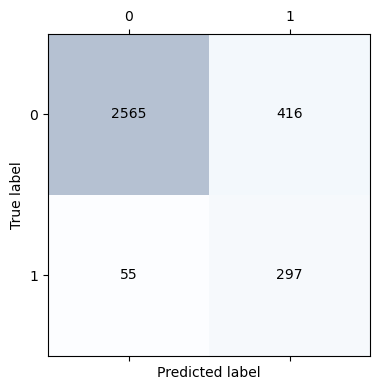


Accuracy: 0.8586858685868587

              precision    recall  f1-score   support

         0.0       0.98      0.86      0.92      2981
         1.0       0.42      0.84      0.56       352

    accuracy                           0.86      3333
   macro avg       0.70      0.85      0.74      3333
weighted avg       0.92      0.86      0.88      3333


23


In [8]:

clf = tree.DecisionTreeClassifier(criterion='entropy')
clf = clf.fit(X_train, y_train)
pred = clf.predict(X_test)

# Obtain accuracy score of learned classifier on test data
print(clf.score(X_test, y_test))
confmat = confusion_matrix(y_test, pred)
fig, ax = plt.subplots(figsize=(4, 4))
ax.matshow(confmat, cmap=plt.cm.Blues, alpha=0.3)
for i in range(confmat.shape[0]):
    for j in range(confmat.shape[1]):
        ax.text(x=j, y=i, s=confmat[i, j], va='center', ha='center',fontsize=10)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.tight_layout()
plt.show()
print()
print("Accuracy:", sklearn.metrics.accuracy_score(y_test, pred))
print()
print(sklearn.metrics.classification_report(y_test, pred))
epsilon = sklearn.metrics.accuracy_score(y_test, pred)
result = binomtest(k=int(epsilon*X_test.shape[0]), n=X_test.shape[0], p=0.05)
result.proportion_ci()

print()
print(clf.tree_.max_depth)

#Print tree
#fig = plt.gcf()
#fig.set_size_inches(200, 100)

#tree.plot_tree(clf, filled=True,rounded=True,feature_names=list(X_train.columns.values))
#fig.savefig('tree.png')
#plt.show()

## Improve results

As can be seen in the last print, the height of the decission tree is very high, and this can lead to overfit. Let's see if configuring some parameters using GridSearchCV we achieve a more general tree that does not worse considerably the metrics. This search will do 10 fold cross validation with the training dataset, and this, should avoid overfitting.

First, let's limit loosely the max depth being betweeen 5 and 15

In [9]:

params = {'min_impurity_decrease': list(np.linspace(0,0.5,50)),'min_samples_split':list(range(2,20,1)), 'max_depth' : list(range(5,15,1))}
clfGS = GridSearchCV(tree.DecisionTreeClassifier(criterion='entropy'), param_grid=params,cv=10,n_jobs=-1)  # If cv is integer, by default is Stratifyed 
clfGS.fit(X_train, y_train)
print("Best Params=",clfGS.best_params_, "Accuracy=", clfGS.best_score_)

c:\Users\Dan-p\anaconda3\lib\site-packages\joblib\externals\loky\process_executor.py:702: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best Params= {'max_depth': 9, 'min_impurity_decrease': 0.0, 'min_samples_split': 15} Accuracy= 0.8773025649337493


0.8523852385238524


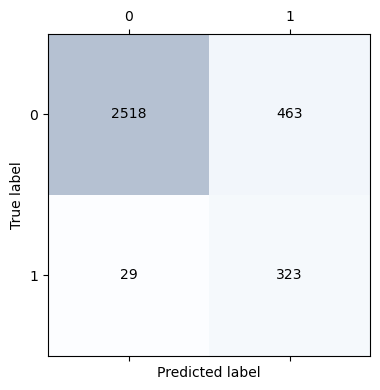


Accuracy: 0.8523852385238524

              precision    recall  f1-score   support

         0.0       0.99      0.84      0.91      2981
         1.0       0.41      0.92      0.57       352

    accuracy                           0.85      3333
   macro avg       0.70      0.88      0.74      3333
weighted avg       0.93      0.85      0.87      3333


9


In [10]:
clf9=tree.DecisionTreeClassifier(criterion='entropy', min_samples_split=clfGS.best_params_['min_samples_split'],min_impurity_decrease=clfGS.best_params_['min_impurity_decrease'], max_depth= clfGS.best_params_['max_depth'])
clf9 = clf9.fit(X_train, y_train)
pred = clf9.predict(X_test)
# Obtain accuracy score of learned classifier on test data
print(clf9.score(X_test, y_test))
confmat = confusion_matrix(y_test, pred)
fig, ax = plt.subplots(figsize=(4, 4))
ax.matshow(confmat, cmap=plt.cm.Blues, alpha=0.3)
for i in range(confmat.shape[0]):
    for j in range(confmat.shape[1]):
        ax.text(x=j, y=i, s=confmat[i, j], va='center', ha='center',fontsize=10)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.tight_layout()
plt.show()
print()
print("Accuracy:", sklearn.metrics.accuracy_score(y_test, pred))
print()
print(sklearn.metrics.classification_report(y_test, pred))
epsilon = sklearn.metrics.accuracy_score(y_test, pred)
result = binomtest(k=int(epsilon*X_test.shape[0]), n=X_test.shape[0], p=0.05)
result.proportion_ci()

print()
print(clf9.tree_.max_depth)
#Print tree
fig = plt.gcf()
fig.set_size_inches(200, 100)

tree.plot_tree(clf9, filled=True,rounded=True,feature_names=list(X_train.columns.values), class_names=True)
fig.savefig('../Plots/Trees/treeDepth9.png')
plt.show()

We obtained better metrics using GridSearch, but, since in the feature selection we found that the best number of features is 8, let's see first how many features are we using with this depth

In [11]:

feature_importances = pd.DataFrame(clf9.feature_importances_,
                                index = X_train.columns,
                                columns = ['importance']).sort_values('importance', 
                                                                    ascending=False)


display(feature_importances[ feature_importances['importance'] > 0])
print(len(feature_importances[ feature_importances['importance'] > 0]))


,importance
duration,0.476545
nr.employed,0.235838
euribor3m,0.065177
emp.var.rate,0.052645
cons.conf.idx,0.045884
age,0.026165
month,0.014899
day_of_week,0.014764
pdays,0.013053
cons.price.idx,0.008897


31



Since we are using 31 features, and in the feature selection we selected 8, let's try to reduce this trying with the GridSearch to not worse so much this metrics.

In [12]:
params = {'min_impurity_decrease': list(np.linspace(0,0.5,50)),'min_samples_split':list(range(2,20,1)), 'max_depth' : list(range(3,7,1))}
clfGS2 = GridSearchCV(tree.DecisionTreeClassifier(criterion='entropy'), param_grid=params,cv=10,n_jobs=-1)  # If cv is integer, by default is Stratifyed 
clfGS2.fit(X_train, y_train)
print("Best Params=",clfGS2.best_params_, "Accuracy=", clfGS2.best_score_)

Best Params= {'max_depth': 5, 'min_impurity_decrease': 0.0, 'min_samples_split': 2} Accuracy= 0.875353539446493


0.8505850585058505


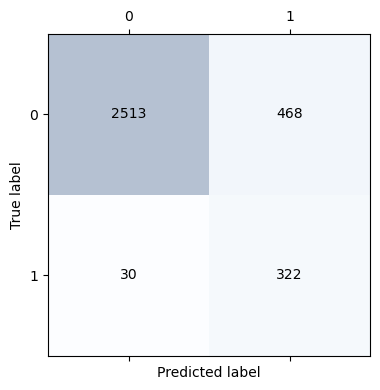


Accuracy: 0.8505850585058505

              precision    recall  f1-score   support

         0.0       0.99      0.84      0.91      2981
         1.0       0.41      0.91      0.56       352

    accuracy                           0.85      3333
   macro avg       0.70      0.88      0.74      3333
weighted avg       0.93      0.85      0.87      3333


5


In [13]:
clf5=tree.DecisionTreeClassifier(criterion='entropy', min_samples_split=clfGS2.best_params_['min_samples_split'],min_impurity_decrease=clfGS2.best_params_['min_impurity_decrease'], max_depth= clfGS2.best_params_['max_depth'])
clf5 = clf5.fit(X_train, y_train)
pred = clf5.predict(X_test)

# Obtain accuracy score of learned classifier on test data
print(clf5.score(X_test, y_test))
confmat = confusion_matrix(y_test, pred)
fig, ax = plt.subplots(figsize=(4, 4))
ax.matshow(confmat, cmap=plt.cm.Blues, alpha=0.3)
for i in range(confmat.shape[0]):
    for j in range(confmat.shape[1]):
        ax.text(x=j, y=i, s=confmat[i, j], va='center', ha='center',fontsize=10)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.tight_layout()
plt.show()
print()
print("Accuracy:", sklearn.metrics.accuracy_score(y_test, pred))
print()
print(sklearn.metrics.classification_report(y_test, pred))
epsilon = sklearn.metrics.accuracy_score(y_test, pred)
result = binomtest(k=int(epsilon*X_test.shape[0]), n=X_test.shape[0], p=0.05)
result.proportion_ci()

print()
print(clf5.tree_.max_depth)
#Print tree
fig = plt.gcf()
fig.set_size_inches(200, 100)

tree.plot_tree(clf5, filled=True,rounded=True,feature_names=list(X_train.columns.values) , class_names=True)
fig.savefig('../Plots/Trees/treeDepth5.png')
plt.show()

As can be seen in the confusion matrix and in the metrics shown in both results (with depth = 9 and with depth = 5), the results are very similar. Therefore, a tree with lower depth is more general and less overfitted, so we will keep this one with depth 5.

In [14]:
feature_importances = pd.DataFrame(clf5.feature_importances_,
                                index = X_train.columns,
                                columns = ['importance']).sort_values('importance', 
                                                                    ascending=False)


display(feature_importances[ feature_importances['importance'] > 0])
print(len(feature_importances[ feature_importances['importance'] > 0]))

,importance
duration,0.543825
emp.var.rate,0.224463
nr.employed,0.122378
cons.conf.idx,0.067137
euribor3m,0.026388
age,0.005121
pdays,0.004011
poutcome_success,0.002853
cons.price.idx,0.001637
job_housemaid,0.001443


11


What's more, 11 features are used in this decision tree, and in the feature selection we found 8. Therefore, this model is closer to what feature selection calculated than the model with depth=9. And also, these features can help to the methods that need a feature selection, because these are, in fact, the most important features to this tree.

Just in case, let's see what happen if we limit more the depth

In [15]:
params = {'min_impurity_decrease': list(np.linspace(0,0.5,50)),'min_samples_split':list(range(2,20,1)), 'max_depth' : list(range(1,4,1))}
clfGS3 = GridSearchCV(tree.DecisionTreeClassifier(criterion='entropy'), param_grid=params,cv=10,n_jobs=-1)  # If cv is integer, by default is Stratifyed 
clfGS3.fit(X_train, y_train)
print("Best Params=",clfGS3.best_params_, "Accuracy=", clfGS3.best_score_)


Best Params= {'max_depth': 3, 'min_impurity_decrease': 0.0, 'min_samples_split': 2} Accuracy= 0.830504342423383


0.798979897989799


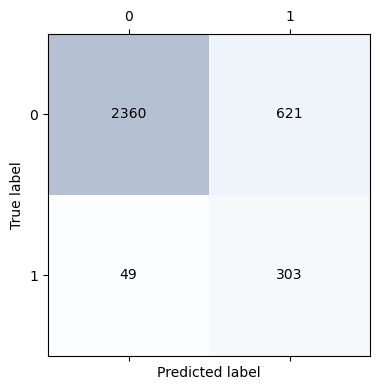


Accuracy: 0.798979897989799

              precision    recall  f1-score   support

         0.0       0.98      0.79      0.88      2981
         1.0       0.33      0.86      0.47       352

    accuracy                           0.80      3333
   macro avg       0.65      0.83      0.68      3333
weighted avg       0.91      0.80      0.83      3333


3


In [16]:
clf1=tree.DecisionTreeClassifier(criterion='entropy', min_samples_split=clfGS3.best_params_['min_samples_split'],min_impurity_decrease=clfGS3.best_params_['min_impurity_decrease'], max_depth= clfGS3.best_params_['max_depth'])
clf1 = clf1.fit(X_train, y_train)
pred = clf1.predict(X_test)

# Obtain accuracy score of learned classifier on test data
print(clf1.score(X_test, y_test))
confmat = confusion_matrix(y_test, pred)
fig, ax = plt.subplots(figsize=(4, 4))
ax.matshow(confmat, cmap=plt.cm.Blues, alpha=0.3)
for i in range(confmat.shape[0]):
    for j in range(confmat.shape[1]):
        ax.text(x=j, y=i, s=confmat[i, j], va='center', ha='center',fontsize=10)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.tight_layout()
plt.show()
print()
print("Accuracy:", sklearn.metrics.accuracy_score(y_test, pred))
print()
print(sklearn.metrics.classification_report(y_test, pred))
epsilon = sklearn.metrics.accuracy_score(y_test, pred)
result = binomtest(k=int(epsilon*X_test.shape[0]), n=X_test.shape[0], p=0.05)
result.proportion_ci()

print()
print(clf1.tree_.max_depth)
#Print tree
fig = plt.gcf()
fig.set_size_inches(200, 100)

tree.plot_tree(clf1, filled=True,rounded=True,feature_names=list(X_train.columns.values) , class_names=True)
fig.savefig('../Plots/Trees/treeDepth3.png')
plt.show()

As can be expected, this restricted depth made the metrics go considerably low, what confirms that the best tree found is the one with depth=5